**HW2 - 2D Object Detection**

In this notebook, we are using an open-source tool called **FiftyOne**  for building high-quality datasets and computer vision models.

If you are running this in Colab, make sure you select a GPU instance under Runtime > Change runtime type since this notebook contains some model training.

Import fiftyone, pytorch and torchvision

In [1]:
!pip install fiftyone
!pip install torch torchvision

     |████████████████████████████████| 1.2 MB 5.2 MB/s 
     |████████████████████████████████| 225 kB 58.8 MB/s 
     |████████████████████████████████| 557 kB 45.9 MB/s 
     |████████████████████████████████| 13.2 MB 23.6 MB/s 
     |████████████████████████████████| 131 kB 58.7 MB/s 
     |████████████████████████████████| 631 kB 66.7 MB/s 
     |████████████████████████████████| 79.9 MB 111 kB/s 
     |████████████████████████████████| 106 kB 74.0 MB/s 
     |████████████████████████████████| 29.2 MB 1.2 MB/s 
     |████████████████████████████████| 55 kB 4.4 MB/s 
     |████████████████████████████████| 47.6 MB 52 kB/s 
     |████████████████████████████████| 82 kB 857 kB/s 
     |████████████████████████████████| 58 kB 8.5 MB/s 
     |████████████████████████████████| 54 kB 4.2 MB/s 
     |████████████████████████████████| 78 kB 8.2 MB/s 
     |████████████████████████████████| 77 kB 7.6 MB/s 
     |████████████████████████████████| 8.1 MB 59.0 MB/s 
     |█████████████████████

Clone the torchvision GitHub repository to use the training and evaluation utilities provided for the [Torchvision Object Deteciton Tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html#defining-the-dataset) that we are using to train a basic object detection model.

In [2]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.3.0

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
remote: Enumerating objects: 52619, done.
remote: Counting objects: 100% (18088/18088), done.
remote: Compressing objects: 100% (3811/3811), done.
remote: Total 52619 (delta 14952), reused 16895 (delta 14072), pack-reused 34531
Receiving objects: 100% (52619/52619), 94.22 MiB | 33.69 MiB/s, done.
Resolving deltas: 100% (41505/41505), done.
Note: checking out 'v0.3.0'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at be376084 version check against PyTorch's CUDA version


Load data from OpenImagesv6 dataset

In [3]:
import torch

torch.manual_seed(1)

import fiftyone as fo
import fiftyone.zoo as foz

In [4]:
dataset = foz.load_zoo_dataset("coco-2017", "validation")

 100% |██████|    1.9Gb/1.9Gb [3.4s elapsed, 0s remaining, 309.2Mb/s]      
Extracting annotations to '/root/fiftyone/coco-2017/raw/instances_val2017.json'
 100% |██████|    6.1Gb/6.1Gb [8.5s elapsed, 0s remaining, 700.6Mb/s]       
Extracting images to '/root/fiftyone/coco-2017/validation/data'
Writing annotations to '/root/fiftyone/coco-2017/validation/labels.json'
Dataset info written to '/root/fiftyone/coco-2017/info.json'
Loading 'coco-2017' split 'validation'
 100% |███████████████| 5000/5000 [29.0s elapsed, 0s remaining, 179.2 samples/s]      
Dataset 'coco-2017-validation' created


Compute metadata on our dataset to get the height and width of images

In [5]:
dataset.compute_metadata()

we change the format of the fiftyone dataset into PyTorch dataset to fit pytorch model

In [6]:
import torch
import fiftyone.utils.coco as fouc
from PIL import Image


class FiftyOneTorchDataset(torch.utils.data.Dataset):
    """A class to construct a PyTorch dataset from a FiftyOne dataset.
    
    Args:
        fiftyone_dataset: a FiftyOne dataset or view that will be used for training or testing
        transforms (None): a list of PyTorch transforms to apply to images and targets when loading
        gt_field ("ground_truth"): the name of the field in fiftyone_dataset that contains the 
            desired labels to load
        classes (None): a list of class strings that are used to define the mapping between
            class names and indices. If None, it will use all classes present in the given fiftyone_dataset.
    """

    def __init__(
        self,
        fiftyone_dataset,
        transforms=None,
        gt_field="ground_truth",
        classes=None,
    ):
        self.samples = fiftyone_dataset
        self.transforms = transforms
        self.gt_field = gt_field

        self.img_paths = self.samples.values("filepath")

        self.classes = classes
        if not self.classes:
            # Get list of distinct labels that exist in the view
            self.classes = self.samples.distinct(
                "%s.detections.label" % gt_field
            )

        if self.classes[0] != "background":
            self.classes = ["background"] + self.classes

        self.labels_map_rev = {c: i for i, c in enumerate(self.classes)}

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        sample = self.samples[img_path]
        metadata = sample.metadata
        img = Image.open(img_path).convert("RGB")

        boxes = []
        labels = []
        area = []
        iscrowd = []
        detections = sample[self.gt_field].detections
        for det in detections:
            category_id = self.labels_map_rev[det.label]
            coco_obj = fouc.COCOObject.from_detection(
                det, metadata, category_id=category_id,
            )
            x, y, w, h = coco_obj.bbox
            boxes.append([x, y, x + w, y + h])
            labels.append(coco_obj.category_id)
            area.append(coco_obj.area)
            iscrowd.append(coco_obj.iscrowd)

        target = {}
        target["boxes"] = torch.as_tensor(boxes, dtype=torch.float32)
        target["labels"] = torch.as_tensor(labels, dtype=torch.int64)
        target["image_id"] = torch.as_tensor([idx])
        target["area"] = torch.as_tensor(area, dtype=torch.float32)
        target["iscrowd"] = torch.as_tensor(iscrowd, dtype=torch.int64)

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.img_paths)

    def get_classes(self):
        return self.classes

create classes_list which takes 5 classes

In [7]:
from fiftyone import ViewField as F

classes_list = ["car", "truck", "person", "bus", "dog"]
classes_view = dataset.filter_labels("ground_truth",
        F("label").is_in(classes_list))

print(len(classes_view))

3019


In [8]:
# From the torchvision references we cloned
import transforms as T

train_transforms = T.Compose([T.ToTensor(), T.RandomHorizontalFlip(0.5)])
test_transforms = T.Compose([T.ToTensor()])

In [9]:
# split the dataset in train and test set
train_view = classes_view.take(2200, seed=42)
test_view = classes_view.exclude([s.id for s in train_view])

In [10]:
# use our dataset and defined transformations
torch_dataset = FiftyOneTorchDataset(train_view, train_transforms, classes=classes_list)
torch_dataset_test = FiftyOneTorchDataset(test_view, test_transforms, classes=classes_list)

The following code loads Faster-RCNN with a ResNet50 backbone from Torchvision and modifies the classifier for the number of classes we are training on.

In [11]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_model(num_classes):
    # load a model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

## Training and Evaluation

In this section, we use the functions and datasets we defined above to initialize, train, and evaluate a model.

In [12]:
model_resnet50 = get_model(len(classes_list)+1)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

In [13]:
# Import functions from the torchvision references we cloned
from engine import train_one_epoch, evaluate
import utils

Training function takes a model and our PyTorch datasets as input

In [14]:
def training(model, torch_dataset, torch_dataset_test, num_epochs=5):
    # define training and validation data loaders
    data_loader = torch.utils.data.DataLoader(
        torch_dataset, batch_size=3, shuffle=True, num_workers=4,
        collate_fn=utils.collate_fn)
    
    data_loader_test = torch.utils.data.DataLoader(
        torch_dataset_test, batch_size=1, shuffle=False, num_workers=4,
        collate_fn=utils.collate_fn)

    # train on the GPU or on the CPU, if a GPU is not available
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    print("Using device %s" % device)

    # move model to the right device
    model.to(device)

    # construct an optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.003,
                                momentum=0.9, weight_decay=0.0005)
    # and a learning rate scheduler
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                    step_size=3,
                                                    gamma=0.1)

    for epoch in range(num_epochs):
        # train for one epoch, printing every 10 iterations
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=30)

        # update the learning rate
        lr_scheduler.step()
        # evaluate on the test dataset
        evaluate(model, data_loader_test, device=device)

In [15]:
training(model_resnet50, torch_dataset, torch_dataset_test, num_epochs=5)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Using device cuda


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [0]  [  0/734]  eta: 0:26:00  lr: 0.000007  loss: 1.9047 (1.9047)  loss_classifier: 1.7543 (1.7543)  loss_box_reg: 0.1361 (0.1361)  loss_objectness: 0.0096 (0.0096)  loss_rpn_box_reg: 0.0046 (0.0046)  time: 2.1262  data: 1.0535  max mem: 3389
Epoch: [0]  [ 30/734]  eta: 0:07:21  lr: 0.000130  loss: 1.3810 (1.7939)  loss_classifier: 0.9810 (1.3085)  loss_box_reg: 0.4175 (0.4113)  loss_objectness: 0.0363 (0.0432)  loss_rpn_box_reg: 0.0306 (0.0310)  time: 0.5789  data: 0.0113  max mem: 5790
Epoch: [0]  [ 60/734]  eta: 0:06:42  lr: 0.000252  loss: 0.7737 (1.3067)  loss_classifier: 0.3502 (0.8409)  loss_box_reg: 0.3885 (0.3971)  loss_objectness: 0.0213 (0.0370)  loss_rpn_box_reg: 0.0160 (0.0316)  time: 0.5703  data: 0.0109  max mem: 5790
Epoch: [0]  [ 90/734]  eta: 0:06:27  lr: 0.000375  loss: 0.7601 (1.1076)  loss_classifier: 0.2505 (0.6508)  loss_box_reg: 0.4074 (0.3903)  loss_objectness: 0.0183 (0.0328)  loss_rpn_box_reg: 0.0197 (0.0337)  time: 0.6203  data: 0.0111  max mem: 5790


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/819]  eta: 0:05:58  model_time: 0.1077 (0.1077)  evaluator_time: 0.0114 (0.0114)  time: 0.4377  data: 0.3171  max mem: 6346
Test:  [100/819]  eta: 0:01:03  model_time: 0.0658 (0.0717)  evaluator_time: 0.0025 (0.0083)  time: 0.0830  data: 0.0042  max mem: 6346
Test:  [200/819]  eta: 0:00:53  model_time: 0.0723 (0.0708)  evaluator_time: 0.0055 (0.0087)  time: 0.0967  data: 0.0095  max mem: 6346
Test:  [300/819]  eta: 0:00:44  model_time: 0.0694 (0.0705)  evaluator_time: 0.0034 (0.0084)  time: 0.0814  data: 0.0039  max mem: 6346
Test:  [400/819]  eta: 0:00:35  model_time: 0.0709 (0.0703)  evaluator_time: 0.0024 (0.0078)  time: 0.0813  data: 0.0038  max mem: 6346
Test:  [500/819]  eta: 0:00:26  model_time: 0.0691 (0.0703)  evaluator_time: 0.0021 (0.0075)  time: 0.0810  data: 0.0047  max mem: 6346
Test:  [600/819]  eta: 0:00:18  model_time: 0.0655 (0.0702)  evaluator_time: 0.0036 (0.0074)  time: 0.0806  data: 0.0042  max mem: 6346
Test:  [700/819]  eta: 0:00:09  model_time: 0.07

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [1]  [  0/734]  eta: 0:19:11  lr: 0.003000  loss: 0.4581 (0.4581)  loss_classifier: 0.1524 (0.1524)  loss_box_reg: 0.2464 (0.2464)  loss_objectness: 0.0474 (0.0474)  loss_rpn_box_reg: 0.0119 (0.0119)  time: 1.5687  data: 0.9625  max mem: 6346
Epoch: [1]  [ 30/734]  eta: 0:07:08  lr: 0.003000  loss: 0.4155 (0.4107)  loss_classifier: 0.1400 (0.1355)  loss_box_reg: 0.2245 (0.2170)  loss_objectness: 0.0188 (0.0297)  loss_rpn_box_reg: 0.0159 (0.0285)  time: 0.5934  data: 0.0109  max mem: 6346
Epoch: [1]  [ 60/734]  eta: 0:06:41  lr: 0.003000  loss: 0.3127 (0.3698)  loss_classifier: 0.1081 (0.1225)  loss_box_reg: 0.1779 (0.1954)  loss_objectness: 0.0121 (0.0244)  loss_rpn_box_reg: 0.0186 (0.0275)  time: 0.5799  data: 0.0112  max mem: 6346
Epoch: [1]  [ 90/734]  eta: 0:06:22  lr: 0.003000  loss: 0.4127 (0.3817)  loss_classifier: 0.1330 (0.1273)  loss_box_reg: 0.1992 (0.2006)  loss_objectness: 0.0159 (0.0248)  loss_rpn_box_reg: 0.0196 (0.0290)  time: 0.5804  data: 0.0120  max mem: 6346


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/819]  eta: 0:05:54  model_time: 0.1122 (0.1122)  evaluator_time: 0.0037 (0.0037)  time: 0.4329  data: 0.3154  max mem: 6346
Test:  [100/819]  eta: 0:01:02  model_time: 0.0665 (0.0706)  evaluator_time: 0.0022 (0.0079)  time: 0.0841  data: 0.0050  max mem: 6346
Test:  [200/819]  eta: 0:00:53  model_time: 0.0722 (0.0704)  evaluator_time: 0.0102 (0.0089)  time: 0.0930  data: 0.0037  max mem: 6346
Test:  [300/819]  eta: 0:00:44  model_time: 0.0697 (0.0703)  evaluator_time: 0.0029 (0.0086)  time: 0.0823  data: 0.0040  max mem: 6346
Test:  [400/819]  eta: 0:00:35  model_time: 0.0710 (0.0702)  evaluator_time: 0.0026 (0.0080)  time: 0.0834  data: 0.0051  max mem: 6346
Test:  [500/819]  eta: 0:00:26  model_time: 0.0688 (0.0703)  evaluator_time: 0.0020 (0.0076)  time: 0.0804  data: 0.0044  max mem: 6346
Test:  [600/819]  eta: 0:00:18  model_time: 0.0657 (0.0702)  evaluator_time: 0.0038 (0.0075)  time: 0.0804  data: 0.0044  max mem: 6346
Test:  [700/819]  eta: 0:00:10  model_time: 0.07

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [2]  [  0/734]  eta: 0:19:01  lr: 0.003000  loss: 0.5909 (0.5909)  loss_classifier: 0.1994 (0.1994)  loss_box_reg: 0.3371 (0.3371)  loss_objectness: 0.0201 (0.0201)  loss_rpn_box_reg: 0.0343 (0.0343)  time: 1.5557  data: 1.0017  max mem: 6346
Epoch: [2]  [ 30/734]  eta: 0:07:16  lr: 0.003000  loss: 0.2690 (0.3338)  loss_classifier: 0.0884 (0.1098)  loss_box_reg: 0.1218 (0.1712)  loss_objectness: 0.0093 (0.0166)  loss_rpn_box_reg: 0.0129 (0.0361)  time: 0.5874  data: 0.0122  max mem: 6346
Epoch: [2]  [ 60/734]  eta: 0:06:50  lr: 0.003000  loss: 0.3085 (0.3325)  loss_classifier: 0.0950 (0.1085)  loss_box_reg: 0.1737 (0.1744)  loss_objectness: 0.0115 (0.0153)  loss_rpn_box_reg: 0.0200 (0.0343)  time: 0.6159  data: 0.0122  max mem: 6346
Epoch: [2]  [ 90/734]  eta: 0:06:26  lr: 0.003000  loss: 0.3976 (0.3513)  loss_classifier: 0.1227 (0.1139)  loss_box_reg: 0.2258 (0.1856)  loss_objectness: 0.0115 (0.0154)  loss_rpn_box_reg: 0.0236 (0.0365)  time: 0.5711  data: 0.0111  max mem: 6346


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/819]  eta: 0:06:04  model_time: 0.1330 (0.1330)  evaluator_time: 0.0033 (0.0033)  time: 0.4454  data: 0.3075  max mem: 6346
Test:  [100/819]  eta: 0:01:01  model_time: 0.0671 (0.0709)  evaluator_time: 0.0021 (0.0065)  time: 0.0822  data: 0.0041  max mem: 6346
Test:  [200/819]  eta: 0:00:52  model_time: 0.0723 (0.0705)  evaluator_time: 0.0065 (0.0071)  time: 0.0894  data: 0.0040  max mem: 6346
Test:  [300/819]  eta: 0:00:43  model_time: 0.0694 (0.0704)  evaluator_time: 0.0024 (0.0070)  time: 0.0811  data: 0.0039  max mem: 6346
Test:  [400/819]  eta: 0:00:34  model_time: 0.0724 (0.0705)  evaluator_time: 0.0023 (0.0065)  time: 0.0947  data: 0.0119  max mem: 6346
Test:  [500/819]  eta: 0:00:26  model_time: 0.0696 (0.0705)  evaluator_time: 0.0016 (0.0062)  time: 0.0783  data: 0.0039  max mem: 6346
Test:  [600/819]  eta: 0:00:18  model_time: 0.0656 (0.0704)  evaluator_time: 0.0028 (0.0061)  time: 0.0789  data: 0.0041  max mem: 6346
Test:  [700/819]  eta: 0:00:09  model_time: 0.07

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [3]  [  0/734]  eta: 0:18:08  lr: 0.000300  loss: 0.0920 (0.0920)  loss_classifier: 0.0374 (0.0374)  loss_box_reg: 0.0527 (0.0527)  loss_objectness: 0.0007 (0.0007)  loss_rpn_box_reg: 0.0012 (0.0012)  time: 1.4833  data: 0.9086  max mem: 6346
Epoch: [3]  [ 30/734]  eta: 0:07:17  lr: 0.000300  loss: 0.2436 (0.3266)  loss_classifier: 0.0684 (0.1112)  loss_box_reg: 0.1230 (0.1735)  loss_objectness: 0.0068 (0.0128)  loss_rpn_box_reg: 0.0176 (0.0292)  time: 0.6030  data: 0.0114  max mem: 6346
Epoch: [3]  [ 60/734]  eta: 0:06:50  lr: 0.000300  loss: 0.3113 (0.3169)  loss_classifier: 0.0868 (0.1077)  loss_box_reg: 0.1776 (0.1693)  loss_objectness: 0.0093 (0.0123)  loss_rpn_box_reg: 0.0137 (0.0276)  time: 0.6006  data: 0.0122  max mem: 6346
Epoch: [3]  [ 90/734]  eta: 0:06:29  lr: 0.000300  loss: 0.2426 (0.3164)  loss_classifier: 0.0669 (0.1056)  loss_box_reg: 0.1522 (0.1705)  loss_objectness: 0.0081 (0.0131)  loss_rpn_box_reg: 0.0098 (0.0272)  time: 0.5828  data: 0.0114  max mem: 6346


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/819]  eta: 0:05:47  model_time: 0.1182 (0.1182)  evaluator_time: 0.0032 (0.0032)  time: 0.4242  data: 0.3011  max mem: 6346
Test:  [100/819]  eta: 0:01:02  model_time: 0.0669 (0.0711)  evaluator_time: 0.0022 (0.0067)  time: 0.0842  data: 0.0047  max mem: 6346
Test:  [200/819]  eta: 0:00:53  model_time: 0.0726 (0.0713)  evaluator_time: 0.0058 (0.0076)  time: 0.0914  data: 0.0051  max mem: 6346
Test:  [300/819]  eta: 0:00:44  model_time: 0.0695 (0.0710)  evaluator_time: 0.0022 (0.0072)  time: 0.0818  data: 0.0051  max mem: 6346
Test:  [400/819]  eta: 0:00:35  model_time: 0.0710 (0.0707)  evaluator_time: 0.0022 (0.0067)  time: 0.0825  data: 0.0046  max mem: 6346
Test:  [500/819]  eta: 0:00:26  model_time: 0.0692 (0.0707)  evaluator_time: 0.0016 (0.0064)  time: 0.0795  data: 0.0049  max mem: 6346
Test:  [600/819]  eta: 0:00:18  model_time: 0.0658 (0.0706)  evaluator_time: 0.0025 (0.0063)  time: 0.0812  data: 0.0060  max mem: 6346
Test:  [700/819]  eta: 0:00:09  model_time: 0.07

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [4]  [  0/734]  eta: 0:20:04  lr: 0.000300  loss: 0.1928 (0.1928)  loss_classifier: 0.0543 (0.0543)  loss_box_reg: 0.1116 (0.1116)  loss_objectness: 0.0020 (0.0020)  loss_rpn_box_reg: 0.0249 (0.0249)  time: 1.6413  data: 1.0732  max mem: 6346
Epoch: [4]  [ 30/734]  eta: 0:07:23  lr: 0.000300  loss: 0.2722 (0.2582)  loss_classifier: 0.0760 (0.0825)  loss_box_reg: 0.1570 (0.1451)  loss_objectness: 0.0056 (0.0081)  loss_rpn_box_reg: 0.0135 (0.0225)  time: 0.6200  data: 0.0110  max mem: 6346
Epoch: [4]  [ 60/734]  eta: 0:06:49  lr: 0.000300  loss: 0.2944 (0.2709)  loss_classifier: 0.0983 (0.0868)  loss_box_reg: 0.1418 (0.1526)  loss_objectness: 0.0065 (0.0084)  loss_rpn_box_reg: 0.0133 (0.0231)  time: 0.5803  data: 0.0115  max mem: 6346
Epoch: [4]  [ 90/734]  eta: 0:06:26  lr: 0.000300  loss: 0.2135 (0.2772)  loss_classifier: 0.0753 (0.0902)  loss_box_reg: 0.1201 (0.1530)  loss_objectness: 0.0050 (0.0089)  loss_rpn_box_reg: 0.0105 (0.0251)  time: 0.5789  data: 0.0121  max mem: 6346


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/819]  eta: 0:05:39  model_time: 0.1294 (0.1294)  evaluator_time: 0.0049 (0.0049)  time: 0.4142  data: 0.2781  max mem: 6346
Test:  [100/819]  eta: 0:01:01  model_time: 0.0668 (0.0709)  evaluator_time: 0.0018 (0.0065)  time: 0.0824  data: 0.0045  max mem: 6346
Test:  [200/819]  eta: 0:00:52  model_time: 0.0727 (0.0707)  evaluator_time: 0.0057 (0.0071)  time: 0.0912  data: 0.0051  max mem: 6346
Test:  [300/819]  eta: 0:00:43  model_time: 0.0699 (0.0706)  evaluator_time: 0.0020 (0.0068)  time: 0.0821  data: 0.0038  max mem: 6346
Test:  [400/819]  eta: 0:00:35  model_time: 0.0713 (0.0704)  evaluator_time: 0.0023 (0.0064)  time: 0.0823  data: 0.0041  max mem: 6346
Test:  [500/819]  eta: 0:00:26  model_time: 0.0693 (0.0705)  evaluator_time: 0.0016 (0.0061)  time: 0.0784  data: 0.0040  max mem: 6346
Test:  [600/819]  eta: 0:00:18  model_time: 0.0657 (0.0704)  evaluator_time: 0.0024 (0.0060)  time: 0.0784  data: 0.0039  max mem: 6346
Test:  [700/819]  eta: 0:00:09  model_time: 0.07

we need to run inference on the test data to get the output in fiftyone format



In [16]:
def convert_torch_predictions(preds, det_id, s_id, w, h, classes):
    # Convert the outputs of the torch model into a FiftyOne Detections object
    dets = []
    for bbox, label, score in zip(
        preds["boxes"].cpu().detach().numpy(), 
        preds["labels"].cpu().detach().numpy(), 
        preds["scores"].cpu().detach().numpy()
    ):
        # Parse prediction into FiftyOne Detection object
        x0,y0,x1,y1 = bbox
        coco_obj = fouc.COCOObject(det_id, s_id, int(label), [x0, y0, x1-x0, y1-y0])
        det = coco_obj.to_detection((w,h), classes)
        det["confidence"] = float(score)
        dets.append(det)
        det_id += 1
        
    detections = fo.Detections(detections=dets)
        
    return detections, det_id

def add_detections(model, torch_dataset, view, field_name="predictions"):
    # Run inference on a dataset and add results to FiftyOne
    torch.set_num_threads(1)
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    print("Using device %s" % device)

    model.eval()
    model.to(device)
    image_paths = torch_dataset.img_paths
    classes = torch_dataset.classes
    det_id = 0
    
    with fo.ProgressBar() as pb:
        for img, targets in pb(torch_dataset):
            # Get FiftyOne sample indexed by unique image filepath
            img_id = int(targets["image_id"][0])
            img_path = image_paths[img_id]
            sample = view[img_path]
            s_id = sample.id
            w = sample.metadata["width"]
            h = sample.metadata["height"]
            
            # Inference
            preds = model(img.unsqueeze(0).to(device))[0]
            
            detections, det_id = convert_torch_predictions(
                preds, 
                det_id, 
                s_id, 
                w, 
                h, 
                classes,
            )
            
            sample[field_name] = detections
            sample.save()

In [17]:
add_detections(model_resnet50, torch_dataset_test, dataset, field_name="predictions")

Using device cuda
 100% |█████████████████| 819/819 [1.5m elapsed, 0s remaining, 9.7 samples/s]      


The results object that is returned stores information like the mAP and contains functions using which we can plot confusion matrices.

In [18]:
results = fo.evaluate_detections(
    test_view, 
    "predictions", 
    classes = ["car", "truck", "person", "bus", "dog"],
    eval_key="eval", 
    compute_mAP=True
)

Evaluating detections...
 100% |█████████████████| 819/819 [23.4s elapsed, 0s remaining, 36.1 samples/s]      
Performing IoU sweep...
 100% |█████████████████| 819/819 [31.2s elapsed, 0s remaining, 29.5 samples/s]      


In [19]:
results.mAP()

0.427306903667436

In [20]:
results.print_report()

              precision    recall  f1-score   support

         car       0.24      0.86      0.37       761
       truck       0.11      0.82      0.20       104
      person       0.46      0.95      0.62      6053
         bus       0.18      0.90      0.30        62
         dog       0.21      0.89      0.34        75

   micro avg       0.40      0.94      0.56      7055
   macro avg       0.24      0.88      0.37      7055
weighted avg       0.43      0.94      0.58      7055



In [21]:
results_interclass = fo.evaluate_detections(
    test_view, 
    "predictions", 
    classes= ["car", "truck", "person", "bus", "dog"],
    compute_mAP=True, 
    classwise=False
)

Evaluating detections...
 100% |█████████████████| 819/819 [21.3s elapsed, 0s remaining, 38.6 samples/s]      
Performing IoU sweep...
 100% |█████████████████| 819/819 [32.0s elapsed, 0s remaining, 25.9 samples/s]      


In [22]:
results_interclass.plot_confusion_matrix()

/usr/local/lib/python3.7/dist-packages/fiftyone/core/plots/plotly.py:1118: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://voxel51.com/docs/fiftyone/user_guide/plots.html#working-in-notebooks for more information.



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


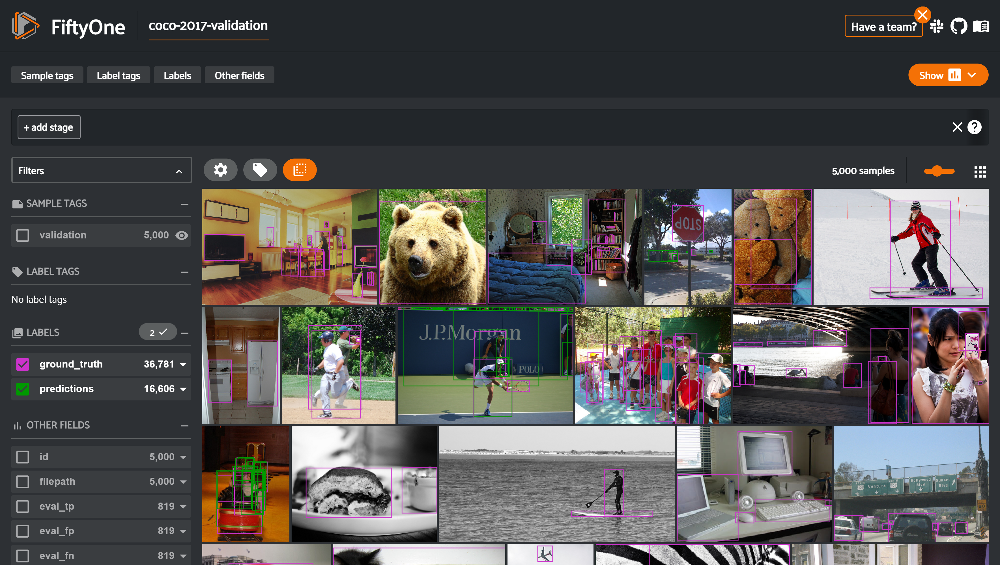

<IPython.core.display.Javascript object>

In [23]:
# Create a session to view dataset
session = fo.launch_app(dataset)

The detection evaluation has attributes eval_fp, eval_tp, and eval_fn to every predicted detection indicating if it is a false positive, true positive, or false negative.

Let's create a view to find the samples by sorting by eval_tp using the FiftyOne App to visualize the results.

In [32]:
session.view = test_view.sort_by("eval_tp", reverse=False)

Enlarged view of one of the images

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


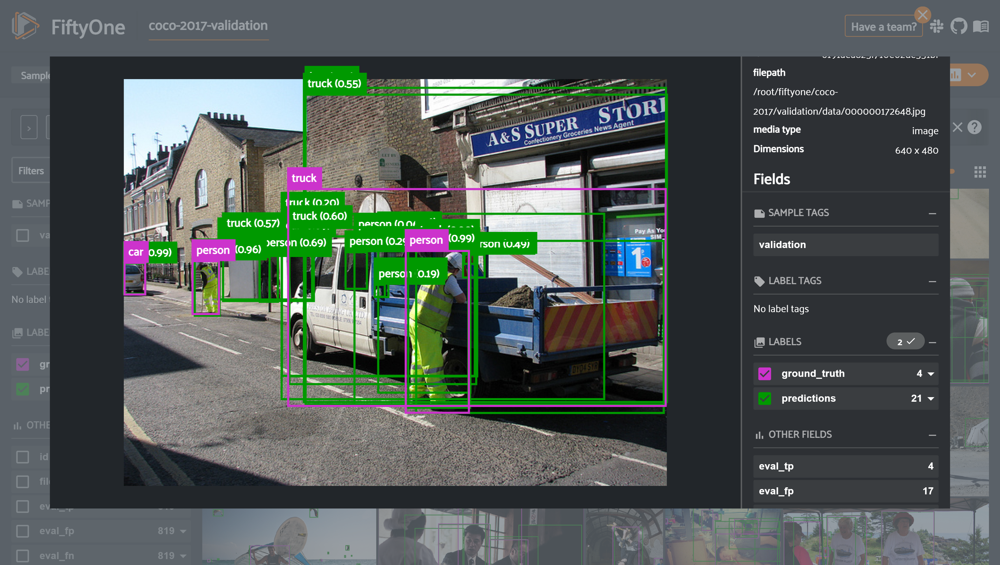

<IPython.core.display.Javascript object>

In [25]:
session.view = test_view.sort_by("eval_tp", reverse=False)

Video Evaluation

In [29]:
import random

import fiftyone as fo
import fiftyone.zoo as foz

dataset = foz.load_zoo_dataset("quickstart-video", dataset_name="video-eval-demo")

#
# Create some test predictions by copying the ground truth objects into a
# new `predictions` field of the frames with 10% of the labels perturbed at random
#

classes = dataset.distinct("frames.detections.detections.label")

def jitter(val):
    if random.random() < 0.10:
        return random.choice(classes)

    return val

predictions = []
for sample_gts in dataset.values("frames.detections"):
    sample_predictions = []
    for frame_gts in sample_gts:
        sample_predictions.append(
            fo.Detections(
                detections=[
                    fo.Detection(
                        label=jitter(gt.label),
                        bounding_box=gt.bounding_box,
                        confidence=random.random(),
                    )
                    for gt in frame_gts.detections
                ]
            )
        )

    predictions.append(sample_predictions)

dataset.set_values("frames.predictions", predictions)

print(dataset)

# Evaluate the frame-level `predictions` against the frame-level
# `detections` objects
results = dataset.evaluate_detections(
    "frames.predictions",
    gt_field="frames.detections",
    eval_key="eval",
)

# Print a classification report
results.print_report()

 100% |████|  281.7Mb/281.7Mb [283.8ms elapsed, 0s remaining, 992.4Mb/s]      
Extracting dataset...
Parsing dataset metadata
Found 10 samples
Dataset info written to '/root/fiftyone/quickstart-video/info.json'
Loading 'quickstart-video'
 100% |███████████████████| 10/10 [7.7s elapsed, 0s remaining, 1.2 samples/s]      
Dataset 'video-eval-demo' created
Name:        video-eval-demo
Media type:  video
Num samples: 10
Persistent:  False
Tags:        []
Sample fields:
    id:       fiftyone.core.fields.ObjectIdField
    filepath: fiftyone.core.fields.StringField
    tags:     fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.Metadata)
Frame fields:
    id:           fiftyone.core.fields.ObjectIdField
    frame_number: fiftyone.core.fields.FrameNumberField
    detections:   fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    predictions:  fiftyone.core.fields.EmbeddedD

In [33]:
fo.launch_app(dataset)

Dataset:          video-eval-demo
Media type:       video
Num samples:      10
Selected samples: 0
Selected labels:  0
Session type:     colab

Dataset:          video-eval-demo
Media type:       video
Num samples:      10
Selected samples: 0
Selected labels:  0
Session type:     colab

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


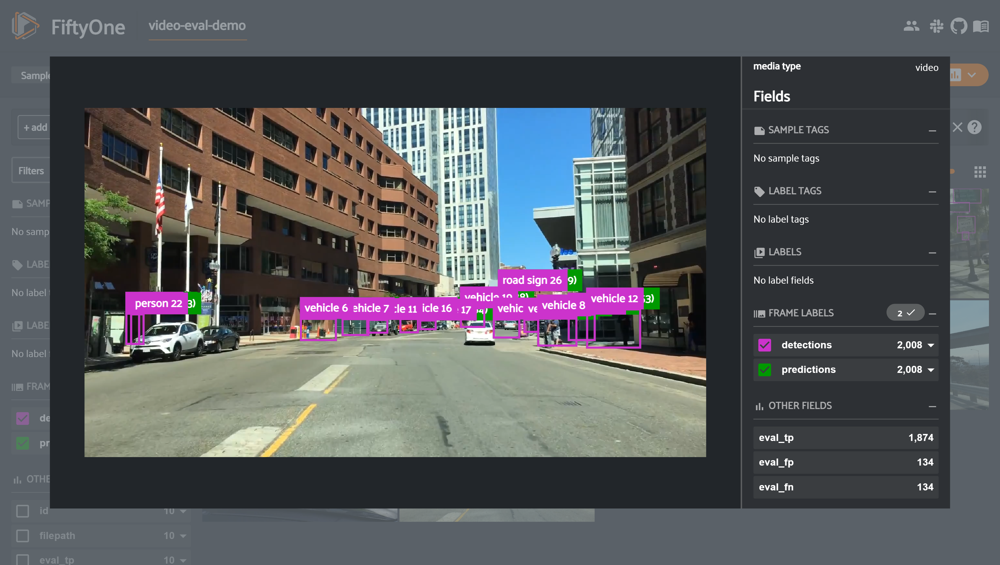

<IPython.core.display.Javascript object>

In [31]:
fo.launch_app(dataset)